In [2]:
import sys
sys.path.append('..')

import os
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import gaussian, threshold_otsu
from skimage.transform import resize
from skimage import io
import pickle
from skimage.measure import regionprops

import matplotlib.pyplot as plt
import torch
import time
import model.model_cnnvae_conditional
import model.optimizer as optimizer
from sklearn.decomposition import PCA
import pandas as pd

In [3]:
sharedSizes=[1024]
dSpecific_filter=[(200,16)]
pID_type='randInit'
pIDemb_size=64

In [3]:
holdOutSamples=['HV1','P22','P14','P27']

In [4]:
sourceDir='/data/xinyi/c2p/data/chromark'
segDir=os.path.join(sourceDir,'nuclear_masks')
imgDir=os.path.join(sourceDir,'raw_data')
conditions=['controls','headneck','meningioma', 'glioma']

outSize=128
savename='pathCentered_'+str(outSize)

imgsC_all=None
imgsP_all=None
imgNames_all=None
proteinNames=None
pID_all=None
for condition_i in conditions:
    print(condition_i)
    segDir_i=os.path.join(segDir,condition_i)
    imgDir_i=os.path.join(imgDir,condition_i)
    for stain in os.listdir(segDir_i):
        print(stain)
        segDir_i_stain=os.path.join(segDir_i,stain)
        imgDir_i_stain=os.path.join(imgDir_i,stain)
        
        segPID2name={}
        for pID_dir in os.listdir(segDir_i_stain):
            pID=pID_dir.split('_')
            segPID2name[pID[0]]=pID_dir
        imgPID2name={}
        for pID_dir in os.listdir(imgDir_i_stain):
            pID=pID_dir.split('_')
            imgPID2name[pID[0]]=pID_dir
        for pID in segPID2name.keys():
            if condition_i=='meningioma' and stain=='dapi_gh2ax_lamin_cd3' and pID=='P33': #skipping incorrect images
                continue
            if pID in holdOutSamples:
                print('hold out: '+pID)
                continue
            print(pID)
            if pID not in imgPID2name:
                print('img not found '+pID)
                continue
            imgDir_i_stain_p=os.path.join(imgDir_i_stain,imgPID2name[pID])
            segDir_i_stain_p=os.path.join(segDir_i_stain,segPID2name[pID])
            
            with open(os.path.join(imgDir_i_stain_p,savename+'_imgNames'), 'rb') as output:
                imgNames=pickle.load(output)
            with open(os.path.join(imgDir_i_stain_p,savename+'_img'), 'rb') as output:
                img=pickle.load(output)

            imgP=np.zeros((img.shape[0],1,img.shape[2],img.shape[3]))
            proteinNames_curr=np.array([])
            stain_list=stain.split('_')
            nImgPerStain=int(img.shape[0]/(len(stain_list)-1))
            np.random.seed(3)
            allIdx_all=np.arange(img.shape[0])
            np.random.shuffle(allIdx_all)
            for s in range(1,len(stain_list)):
                s_start=(s-1)*nImgPerStain
                if s==len(stain_list)-1:
                    s_end=img.shape[0]
                else:
                    s_end=s*nImgPerStain
                imgP[s_start:s_end]=img[allIdx_all[s_start:s_end],s].reshape(s_end-s_start,1,img.shape[2],img.shape[3])
                proteinNames_curr=np.concatenate((proteinNames_curr,np.repeat(stain_list[s],s_end-s_start)))
            
            if pID_all is None:
                pID_all=np.repeat(pID,img.shape[0])
                imgsC_all=img[allIdx_all,[0]]
                imgNames_all=imgNames[allIdx_all]
                proteinNames=proteinNames_curr
                imgsP_all=imgP
            else:
                pID_all=np.concatenate((pID_all,np.repeat(pID,img.shape[0])))
                imgsC_all=np.concatenate((imgsC_all,img[allIdx_all,[0]]),axis=0)
                imgNames_all=np.concatenate((imgNames_all,imgNames[allIdx_all]))
                proteinNames=np.concatenate((proteinNames,proteinNames_curr))
                imgsP_all=np.concatenate((imgsP_all,imgP),axis=0)
imgsC_all=imgsC_all.reshape(imgsC_all.shape[0],1,imgsC_all.shape[1],imgsC_all.shape[2])

controls
dapi_gh2ax_lamin
HV5
HV4
HV2
HV10
hold out: HV1
HV7
HV9
HV8
HV3
HV6
dapi_cd8_cd4
hold out: HV1
HV8
HV6
HV7
HV4
HV5
HV3
HV2
headneck
dapi_gh2ax_lamin_cd3
P72
P63
hold out: P14
P44
P41
P56
P18
P55
P50
P24
dapi_cd16_cd4_cd8
P55
P56
P72
hold out: P14
P18
P41
P44
P63
P50
P24
meningioma
dapi_gh2ax_lamin_cd3
hold out: P27
P70
P83
P42
P59
P38
P48
P37
P62
dapi_cd16_cd4_cd8
P42
P48
P62
P38
P83
P37
P33
P70
P59
hold out: P27
glioma
dapi_gh2ax_lamin_cd3
P46
P16
P52
hold out: P22
P84
P47
P57
P15
P29
img not found P29
P68
dapi_cd16_cd4_cd8
P46
P47
P29
P52
P57
hold out: P22
P68
P16
P84
P15


In [5]:
imgsC_all.shape

(29174, 1, 128, 128)

In [6]:
nProt=np.unique(proteinNames).size
pnames,revIdx,pCounts=np.unique(proteinNames,return_inverse=True,return_counts=True)
plabels=torch.tensor(np.arange(pnames.size)[revIdx]).long()

In [7]:
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
os.environ["CUDA_VISIBLE_DEVICES"] = "3"

In [8]:
#VAE settings
seed=3
epochs=5001
saveFreq=100
lr_latent=0.001 #initial learning rate
lr_decoder=0.0001
weight_decay=0 #Weight for L2 loss on embedding matrix.

# batchsize=4
batchsize=256
kernel_size=4
stride=2
padding=1

# fc_dim1=6000
hidden1=64 #Number of channels in hidden layer 1
hidden2=128 
hidden3=256
hidden4=256
hidden5=96
hidden5_xy=4
fc_dim1=96*hidden5_xy*hidden5_xy
fc_dim2=6000

dropout=0.01
kl_weight=0.0000001





In [9]:
printFreq=1
trainIdx=np.arange(imgsC_all.shape[0])
def train(epoch):
    t = time.time()
    modelcnn_dnaShared.train()
    modelcnn_pShared.train()

    loss_x_trainShared_all_dna=0
    loss_x_trainShared_all_protein=0
    loss_lNorm_all=0
    loss_all=0
    ntrainBatches=int(np.ceil(trainIdx.shape[0]/batchsize))
    for i in range(ntrainBatches):
#         if i%200==0:
#         print(i)
        trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
        traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
        traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
        trainIdx_i=torch.tensor(trainIdx_i)
        trainInput_ID=plabels[trainIdx_i].cuda()
        trainInput_shared=latent_shared(trainIdx_i).cuda().float()
        if addNoise:
            trainInput_shared=trainInput_shared+torch.randn_like(trainInput_shared)

        optimizer_dnaShared.zero_grad()
        optimizer_pShared.zero_grad()
        optimizer_latent.zero_grad()

        reconShared_dna=modelcnn_dnaShared(trainInput_shared,pIDemb(trainInput_ID))
        reconShared_protein=modelcnn_pShared(trainInput_shared,pIDemb(trainInput_ID))
        
        loss_xShared_train_protein=loss_x(reconShared_protein,traintarget_protein)
        loss_xShared_train_dna=loss_x(reconShared_dna,traintarget_dna)
        
        loss=loss_xShared_train_protein+loss_xShared_train_dna
        if addNoise:
            loss_lNorm=torch.mean(torch.linalg.norm(latent_shared(trainIdx_i).cuda(),dim=1))/latent_shared.embedding_dim
            loss_lNorm_all+=loss_lNorm.item()
            loss+=loss_lNorm*actDecay
            
        
        loss_x_trainShared_all_dna+=loss_xShared_train_dna.item()
        loss_x_trainShared_all_protein+=loss_xShared_train_protein.item()
        loss_all+=loss.item()
        
        loss.backward()
        optimizer_dnaShared.step()
        optimizer_pShared.step()
        optimizer_latent.step()


    loss_x_trainShared_all_dna=loss_x_trainShared_all_dna/ntrainBatches
    loss_x_trainShared_all_protein=loss_x_trainShared_all_protein/ntrainBatches
    loss_all=loss_all/ntrainBatches
    if addNoise:
        loss_lNorm_all=loss_lNorm_all/ntrainBatches

#     with torch.no_grad():
#         modelcnn_dna.eval()
#         modelcnn_protein.eval()
#         modelcnn_dnaShared.eval()
#         modelcnn_pShared.eval()



#         loss_val_all=0
#         loss_x_val_all_dna=0
#         loss_x_valShared_all_dna=0
#         loss_x_val_all_protein=0
#         loss_x_valShared_all_protein=0
#         nvalBatches=int(np.ceil(valIdx.shape[0]/batchsize))
#         for i in range(nvalBatches):
#             valIdx_i=valIdx[i*batchsize:min((i+1)*batchsize,valIdx.shape[0])]
#             valtarget_protein=torch.tensor(imgsP_all[valIdx_i]).cuda().float()
#             valtarget_dna=torch.tensor(imgsC_all[valIdx_i]).cuda().float()
#             valInput_ID=plabels[valIdx_i].cuda()
#             valIdx_i=torch.tensor(valIdx_i)
#             valInput_shared=latent_shared(valIdx_i).cuda().float()
#             valInput_dna=latent_dna(valIdx_i).cuda().float()
#             valInput_protein=latent_protein(valIdx_i).cuda().float()

#             recon_dna= modelcnn_dna(torch.cat((valInput_shared,valInput_dna),dim=1),pIDemb(valInput_ID))
#             reconShared_dna=modelcnn_dnaShared(valInput_shared,pIDemb(valInput_ID))
#             recon_protein= modelcnn_protein(torch.cat((valInput_shared,valInput_protein),dim=1),pIDemb(valInput_ID))
#             reconShared_protein=modelcnn_pShared(valInput_shared,pIDemb(valInput_ID))



#             loss_x_val_protein=loss_x(recon_protein, valtarget_protein)
#             loss_xShared_val_protein=loss_x(reconShared_protein,valtarget_protein)
#             loss_x_val_dna=loss_x(recon_dna, valtarget_dna)
#             loss_xShared_val_dna=loss_x(reconShared_dna,valtarget_dna)

#             loss=loss_x_val_protein+loss_xShared_val_protein+loss_x_val_dna+loss_xShared_val_dna

#             loss_x_val_all_dna+=loss_x_val_dna.item()
#             loss_x_valShared_all_dna+=loss_xShared_val_dna.item()
#             loss_x_val_all_protein+=loss_x_val_protein.item()
#             loss_x_valShared_all_protein+=loss_xShared_val_protein.item()
#             loss_val_all+=loss.item()

#         loss_x_val_all_dna=loss_x_val_all_dna/nvalBatches
#         loss_x_valShared_all_dna=loss_x_valShared_all_dna/nvalBatches
#         loss_x_val_all_protein=loss_x_val_all_protein/nvalBatches
#         loss_x_valShared_all_protein=loss_x_valShared_all_protein/nvalBatches
#         loss_val_all=loss_val_all/nvalBatches



    if epoch%printFreq==0:
        print('Epoch: {:04d}'.format(epoch),
              'loss_train: {:.4f}'.format(loss_all),
              'loss_xShared_train_dna: {:.4f}'.format(loss_x_trainShared_all_dna),
              'loss_xShared_train_protein: {:.4f}'.format(loss_x_trainShared_all_protein),
              'time: {:.4f}s'.format(time.time() - t))
    return loss_all,loss_x_trainShared_all_dna,loss_x_trainShared_all_protein,loss_lNorm_all

In [4]:
match_weight=1
sharedWeight=1
addNoise=True
actDecay=0.001
name_train='splitChannels_conditional_lord_withNoise_fullyJoint'
modelname_train='cnn_vae_pbmc_lord'
logsavepath_train=os.path.join('/data/xinyi/c2p/log/',modelname_train,name_train)
modelsavepath_train=os.path.join('/data/xinyi/c2p/models/',modelname_train,name_train)
plotsavepath_train=os.path.join('/data/xinyi/c2p/plots/',modelname_train,name_train)

if not os.path.exists(os.path.join('/data/xinyi/c2p/log/',modelname_train)):
    os.mkdir(os.path.join('/data/xinyi/c2p/log/',modelname_train))
    os.mkdir(os.path.join('/data/xinyi/c2p/models/',modelname_train))
    os.mkdir(os.path.join('/data/xinyi/c2p/plots/',modelname_train))
if not os.path.exists(logsavepath_train):
    os.mkdir(logsavepath_train)
    os.mkdir(os.path.join(logsavepath_train,'dna'))
    os.mkdir(os.path.join(logsavepath_train,'protein'))
if not os.path.exists(modelsavepath_train):
    os.mkdir(modelsavepath_train)
    os.mkdir(os.path.join(modelsavepath_train,'dna'))
    os.mkdir(os.path.join(modelsavepath_train,'protein'))
if not os.path.exists(plotsavepath_train):
    os.mkdir(plotsavepath_train)
    os.mkdir(os.path.join(plotsavepath_train,'dna'))
    os.mkdir(os.path.join(plotsavepath_train,'protein'))




In [12]:

logsavepath_p_dna=os.path.join(logsavepath_train,'dna')
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
plotsavepath_p_dna=os.path.join(plotsavepath_train,'dna')
if not os.path.exists(logsavepath_p_dna):
    os.mkdir(logsavepath_p_dna)
if not os.path.exists(modelsavepath_p_dna):
    os.mkdir(modelsavepath_p_dna)
if not os.path.exists(plotsavepath_p_dna):
    os.mkdir(plotsavepath_p_dna)

logsavepath_p_protein=os.path.join(logsavepath_train,'protein')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
plotsavepath_p_protein=os.path.join(plotsavepath_train,'protein')
if not os.path.exists(logsavepath_p_protein):
    os.mkdir(logsavepath_p_protein)
if not os.path.exists(modelsavepath_p_protein):
    os.mkdir(modelsavepath_p_protein)
if not os.path.exists(plotsavepath_p_protein):
    os.mkdir(plotsavepath_p_protein)



for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared

        loss_x=torch.nn.MSELoss()

        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='cnn_vae_pbmc_lord':
            modelcnn_dnaShared=model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize,pIDemb_size)
            modelcnn_pShared=model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize,pIDemb_size)
        modelcnn_dnaShared.cuda()
        modelcnn_pShared.cuda()

        optimizer_dnaShared = torch.optim.Adam(modelcnn_dnaShared.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_pShared = torch.optim.Adam(modelcnn_pShared.parameters(), lr=lr_decoder, weight_decay=weight_decay)

        train_loss=[np.inf]*(epochs)
        train_loss_xShared_dna=[np.inf]*(epochs)

        train_loss_xShared_protein=[np.inf]*(epochs)
        
        train_lNorm=[np.inf]*(epochs)

        t_ep=time.time()

        stateDict_train_dnaShared={}
        stateDict_train_proteinShared={}
        
        
        latent_shared=torch.nn.Embedding(proteinNames.size,currLatentSize)
        pIDemb=torch.nn.Embedding(nProt, pIDemb_size).cuda()
        optimizer_latent= torch.optim.Adam([latent_shared.weight,pIDemb.weight], lr=lr_latent, weight_decay=weight_decay)


#         epCounts=0
        for ep in range(epochs):
            train_loss[ep],train_loss_xShared_dna[ep],train_loss_xShared_protein[ep],train_lNorm[ep]=train(ep)

#             if ep>200 and (val_loss_x_dna[ep]>=val_loss_x_dna[ep-200] or val_loss_x_protein[ep]>=val_loss_x_protein[ep-200]):
#                 epCounts+=1
#             else:
#                 epCounts=0

#             if epCounts>100:
#                 break


            if ep%saveFreq == (saveFreq-1):
                stateDict_train_dnaShared[ep]=modelcnn_dnaShared.cpu().state_dict()
                stateDict_train_proteinShared[ep]=modelcnn_pShared.cpu().state_dict()
                with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_shared.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_protein,'pIDemb_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(pIDemb.weight, output, pickle.HIGHEST_PROTOCOL)


            modelcnn_dnaShared.cuda()
            modelcnn_pShared.cuda()
            torch.cuda.empty_cache()
        print(' total time: {:.4f}s'.format(time.time() - t_ep))

        with open(os.path.join(modelsavepath_p_dna,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_dnaShared, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_protein,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_proteinShared, output, pickle.HIGHEST_PROTOCOL)
        

        with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_xShared_dna, output, pickle.HIGHEST_PROTOCOL)


        with open(os.path.join(logsavepath_p_protein,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_xShared_protein, output, pickle.HIGHEST_PROTOCOL)
            
        with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)), 'wb') as output:
            pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)



        plt.plot(np.arange(epochs),train_loss_xShared_dna)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training shared recon','validation shared recon'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()

        plt.plot(np.arange(epochs),train_loss_xShared_protein)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training shared recon','validation shared recon'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()










1024
200
Epoch: 0000 loss_train: 0.1753 loss_xShared_train_dna: 0.0861 loss_xShared_train_protein: 0.0891 time: 38.9023s
Epoch: 0001 loss_train: 0.0758 loss_xShared_train_dna: 0.0336 loss_xShared_train_protein: 0.0422 time: 33.4007s
Epoch: 0002 loss_train: 0.0612 loss_xShared_train_dna: 0.0236 loss_xShared_train_protein: 0.0376 time: 32.9777s
Epoch: 0003 loss_train: 0.0563 loss_xShared_train_dna: 0.0205 loss_xShared_train_protein: 0.0357 time: 34.6915s
Epoch: 0004 loss_train: 0.0541 loss_xShared_train_dna: 0.0193 loss_xShared_train_protein: 0.0348 time: 37.7766s
Epoch: 0005 loss_train: 0.0527 loss_xShared_train_dna: 0.0184 loss_xShared_train_protein: 0.0343 time: 34.8908s
Epoch: 0006 loss_train: 0.0517 loss_xShared_train_dna: 0.0181 loss_xShared_train_protein: 0.0335 time: 32.7333s
Epoch: 0007 loss_train: 0.0512 loss_xShared_train_dna: 0.0180 loss_xShared_train_protein: 0.0331 time: 30.6932s
Epoch: 0008 loss_train: 0.0504 loss_xShared_train_dna: 0.0180 loss_xShared_train_protein: 0.032

Epoch: 0077 loss_train: 0.0084 loss_xShared_train_dna: 0.0057 loss_xShared_train_protein: 0.0027 time: 36.9928s
Epoch: 0078 loss_train: 0.0083 loss_xShared_train_dna: 0.0056 loss_xShared_train_protein: 0.0027 time: 39.3870s
Epoch: 0079 loss_train: 0.0083 loss_xShared_train_dna: 0.0056 loss_xShared_train_protein: 0.0027 time: 36.5530s
Epoch: 0080 loss_train: 0.0082 loss_xShared_train_dna: 0.0055 loss_xShared_train_protein: 0.0026 time: 35.0520s
Epoch: 0081 loss_train: 0.0082 loss_xShared_train_dna: 0.0055 loss_xShared_train_protein: 0.0026 time: 33.1005s
Epoch: 0082 loss_train: 0.0081 loss_xShared_train_dna: 0.0055 loss_xShared_train_protein: 0.0026 time: 36.2309s
Epoch: 0083 loss_train: 0.0081 loss_xShared_train_dna: 0.0054 loss_xShared_train_protein: 0.0026 time: 35.2304s
Epoch: 0084 loss_train: 0.0081 loss_xShared_train_dna: 0.0054 loss_xShared_train_protein: 0.0026 time: 38.6591s
Epoch: 0085 loss_train: 0.0080 loss_xShared_train_dna: 0.0053 loss_xShared_train_protein: 0.0026 time: 3

Epoch: 0151 loss_train: 0.0061 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 26.4624s
Epoch: 0152 loss_train: 0.0061 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 26.0550s
Epoch: 0153 loss_train: 0.0060 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 25.6254s
Epoch: 0154 loss_train: 0.0060 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 24.9915s
Epoch: 0155 loss_train: 0.0060 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 26.8127s
Epoch: 0156 loss_train: 0.0060 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 25.4439s
Epoch: 0157 loss_train: 0.0060 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 26.1069s
Epoch: 0158 loss_train: 0.0060 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 25.5610s
Epoch: 0159 loss_train: 0.0060 loss_xShared_train_dna: 0.0039 loss_xShared_train_protein: 0.0021 time: 2

Epoch: 0228 loss_train: 0.0052 loss_xShared_train_dna: 0.0033 loss_xShared_train_protein: 0.0019 time: 23.8338s
Epoch: 0229 loss_train: 0.0052 loss_xShared_train_dna: 0.0033 loss_xShared_train_protein: 0.0019 time: 23.5030s
Epoch: 0234 loss_train: 0.0052 loss_xShared_train_dna: 0.0033 loss_xShared_train_protein: 0.0019 time: 26.2380s
Epoch: 0235 loss_train: 0.0052 loss_xShared_train_dna: 0.0033 loss_xShared_train_protein: 0.0019 time: 24.8523s
Epoch: 0236 loss_train: 0.0052 loss_xShared_train_dna: 0.0033 loss_xShared_train_protein: 0.0019 time: 26.7965s
Epoch: 0237 loss_train: 0.0052 loss_xShared_train_dna: 0.0033 loss_xShared_train_protein: 0.0019 time: 26.9221s
Epoch: 0238 loss_train: 0.0051 loss_xShared_train_dna: 0.0032 loss_xShared_train_protein: 0.0019 time: 26.7200s
Epoch: 0239 loss_train: 0.0051 loss_xShared_train_dna: 0.0032 loss_xShared_train_protein: 0.0018 time: 26.1177s
Epoch: 0240 loss_train: 0.0051 loss_xShared_train_dna: 0.0032 loss_xShared_train_protein: 0.0018 time: 2

Epoch: 0306 loss_train: 0.0047 loss_xShared_train_dna: 0.0030 loss_xShared_train_protein: 0.0017 time: 23.0546s
Epoch: 0307 loss_train: 0.0047 loss_xShared_train_dna: 0.0030 loss_xShared_train_protein: 0.0017 time: 25.5253s
Epoch: 0308 loss_train: 0.0047 loss_xShared_train_dna: 0.0030 loss_xShared_train_protein: 0.0017 time: 26.0679s
Epoch: 0309 loss_train: 0.0047 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 25.5504s
Epoch: 0310 loss_train: 0.0047 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 22.2037s
Epoch: 0311 loss_train: 0.0047 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 23.0895s
Epoch: 0312 loss_train: 0.0047 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 23.0565s
Epoch: 0313 loss_train: 0.0046 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 23.9846s
Epoch: 0314 loss_train: 0.0046 loss_xShared_train_dna: 0.0029 loss_xShared_train_protein: 0.0017 time: 2

Epoch: 0380 loss_train: 0.0044 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 26.4541s
Epoch: 0381 loss_train: 0.0044 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 24.9866s
Epoch: 0382 loss_train: 0.0044 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 24.0007s
Epoch: 0383 loss_train: 0.0044 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 32.0641s
Epoch: 0384 loss_train: 0.0044 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 26.7729s
Epoch: 0385 loss_train: 0.0044 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 29.5410s
Epoch: 0386 loss_train: 0.0043 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 27.0233s
Epoch: 0387 loss_train: 0.0043 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 29.8814s
Epoch: 0388 loss_train: 0.0043 loss_xShared_train_dna: 0.0027 loss_xShared_train_protein: 0.0016 time: 2

Epoch: 0454 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 23.9817s
Epoch: 0455 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 24.0087s
Epoch: 0456 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 24.6563s
Epoch: 0457 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 26.8898s
Epoch: 0458 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 23.6983s
Epoch: 0459 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 24.6393s
Epoch: 0460 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 25.6609s
Epoch: 0461 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 26.6044s
Epoch: 0462 loss_train: 0.0041 loss_xShared_train_dna: 0.0025 loss_xShared_train_protein: 0.0016 time: 2

Epoch: 0528 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 27.2873s
Epoch: 0529 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 24.4569s
Epoch: 0530 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 29.0814s
Epoch: 0531 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 29.7603s
Epoch: 0532 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 29.8025s
Epoch: 0533 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 27.8130s
Epoch: 0534 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 29.3398s
Epoch: 0535 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 25.9343s
Epoch: 0536 loss_train: 0.0040 loss_xShared_train_dna: 0.0024 loss_xShared_train_protein: 0.0015 time: 2

Epoch: 0602 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 21.1858s
Epoch: 0603 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 20.9072s
Epoch: 0604 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 20.6761s
Epoch: 0605 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 21.5957s
Epoch: 0606 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 21.2477s
Epoch: 0607 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 21.4960s
Epoch: 0608 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 21.4183s
Epoch: 0609 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 21.5939s
Epoch: 0610 loss_train: 0.0038 loss_xShared_train_dna: 0.0023 loss_xShared_train_protein: 0.0015 time: 2

Epoch: 0676 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 22.3055s
Epoch: 0677 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 22.0267s
Epoch: 0678 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 22.2243s
Epoch: 0679 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 21.9224s
Epoch: 0680 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 22.0527s
Epoch: 0681 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 21.7875s
Epoch: 0682 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 22.0475s
Epoch: 0683 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 21.6033s
Epoch: 0684 loss_train: 0.0037 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0015 time: 2

Epoch: 0750 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 22.5281s
Epoch: 0751 loss_train: 0.0036 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0014 time: 22.4636s
Epoch: 0752 loss_train: 0.0036 loss_xShared_train_dna: 0.0022 loss_xShared_train_protein: 0.0014 time: 22.3881s
Epoch: 0753 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 22.3592s
Epoch: 0754 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 22.4090s
Epoch: 0755 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 20.9635s
Epoch: 0756 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 22.0297s
Epoch: 0757 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 20.6613s
Epoch: 0758 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 2

Epoch: 0824 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 20.7439s
Epoch: 0825 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 21.1020s
Epoch: 0826 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 21.1660s
Epoch: 0827 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 21.2377s
Epoch: 0828 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 21.2362s
Epoch: 0829 loss_train: 0.0036 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 21.1203s
Epoch: 0830 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 21.0823s
Epoch: 0831 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 21.5624s
Epoch: 0832 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 2

Epoch: 0898 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 23.8367s
Epoch: 0899 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 22.8091s
Epoch: 0900 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 20.6421s
Epoch: 0901 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 20.8497s
Epoch: 0902 loss_train: 0.0035 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 21.4404s
Epoch: 0903 loss_train: 0.0035 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.1235s
Epoch: 0904 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 20.7190s
Epoch: 0905 loss_train: 0.0035 loss_xShared_train_dna: 0.0021 loss_xShared_train_protein: 0.0014 time: 19.6423s
Epoch: 0906 loss_train: 0.0035 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 2

Epoch: 0972 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.5010s
Epoch: 0973 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.4318s
Epoch: 0974 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.3480s
Epoch: 0975 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.3742s
Epoch: 0976 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.4569s
Epoch: 0977 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.4456s
Epoch: 0978 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.4033s
Epoch: 0979 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.3912s
Epoch: 0980 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 2

Epoch: 1046 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 20.5414s
Epoch: 1047 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 21.2253s
Epoch: 1048 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 21.8315s
Epoch: 1049 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 21.9187s
Epoch: 1050 loss_train: 0.0034 loss_xShared_train_dna: 0.0020 loss_xShared_train_protein: 0.0014 time: 21.9187s
Epoch: 1051 loss_train: 0.0034 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 21.8447s
Epoch: 1052 loss_train: 0.0034 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 21.7093s
Epoch: 1053 loss_train: 0.0034 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 22.0152s
Epoch: 1054 loss_train: 0.0034 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 2

Epoch: 1120 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 20.4344s
Epoch: 1121 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 23.1578s
Epoch: 1122 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 20.7448s
Epoch: 1123 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 20.0167s
Epoch: 1124 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 20.2147s
Epoch: 1125 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 20.2718s
Epoch: 1126 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 20.3283s
Epoch: 1127 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 20.4654s
Epoch: 1128 loss_train: 0.0033 loss_xShared_train_dna: 0.0019 loss_xShared_train_protein: 0.0014 time: 2

KeyboardInterrupt: 

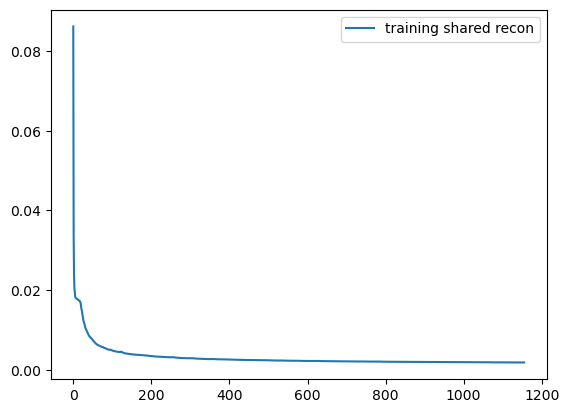

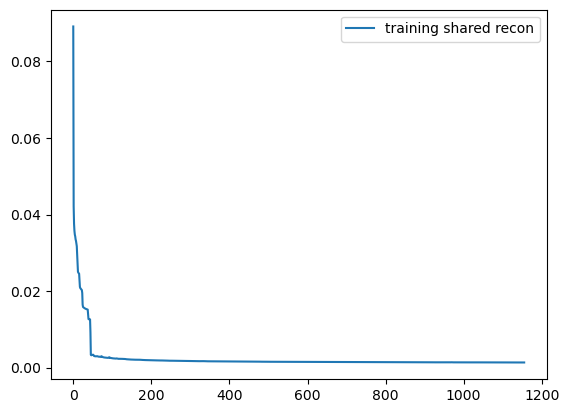

In [13]:
with open(os.path.join(modelsavepath_p_dna,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(stateDict_train_dnaShared, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_protein,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(stateDict_train_proteinShared, output, pickle.HIGHEST_PROTOCOL)


with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_dna,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(train_loss_xShared_dna, output, pickle.HIGHEST_PROTOCOL)


with open(os.path.join(logsavepath_p_protein,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
    pickle.dump(train_loss_xShared_protein, output, pickle.HIGHEST_PROTOCOL)

with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)), 'wb') as output:
    pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)



plt.plot(np.arange(epochs),train_loss_xShared_dna)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training shared recon','validation shared recon'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
plt.show()

plt.plot(np.arange(epochs),train_loss_xShared_protein)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training shared recon','validation shared recon'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
plt.show()

In [6]:
currLatentSize=sharedSizes[0]
logsavepath_p_dna=os.path.join(logsavepath_train,'dna')
plotsavepath_p_dna=os.path.join(plotsavepath_train,'dna')
with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)), 'rb') as output:
    train_lNorm=pickle.load(output)

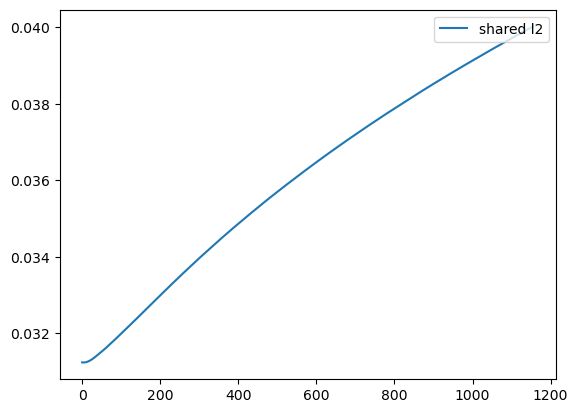

In [9]:
plt.plot(np.arange(5001),train_lNorm)
plt.legend(['shared l2'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_lNorm'+str(currLatentSize)+'.jpg'))
plt.show()

In [14]:
with torch.no_grad():
    i=0
    trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
    traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
    trainIdx_i=torch.tensor(trainIdx_i)
    traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
    trainInput_ID=plabels[trainIdx_i].cuda()
    trainInput_shared=latent_shared(trainIdx_i).cuda().float()
    #         print(trainInput.shape)


    reconShared_dna=modelcnn_dnaShared(trainInput_shared,pIDemb(trainInput_ID))
    reconShared_protein=modelcnn_pShared(trainInput_shared,pIDemb(trainInput_ID))

0


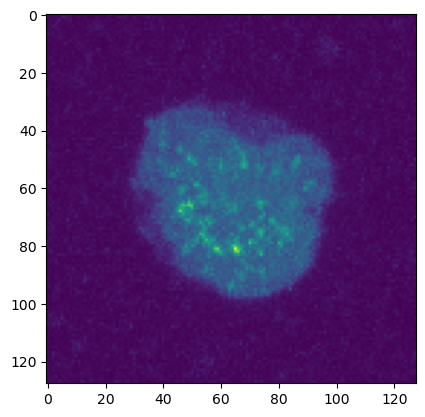

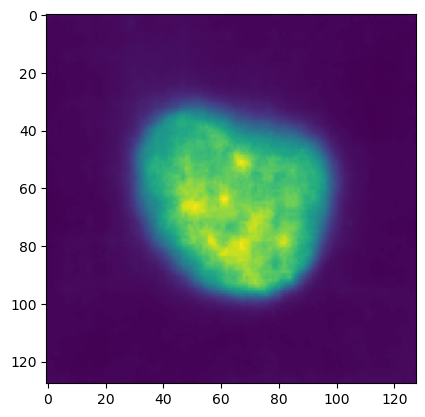

1


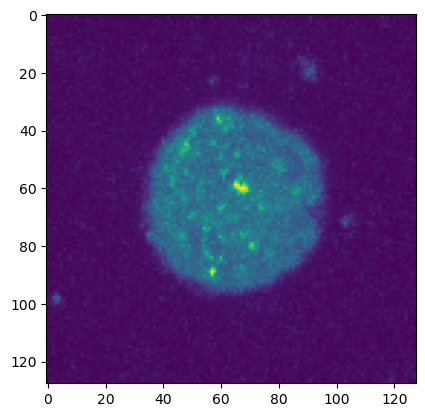

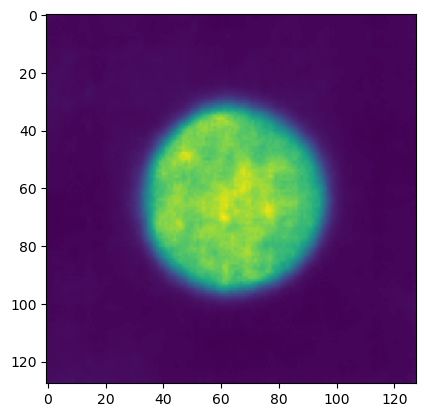

2


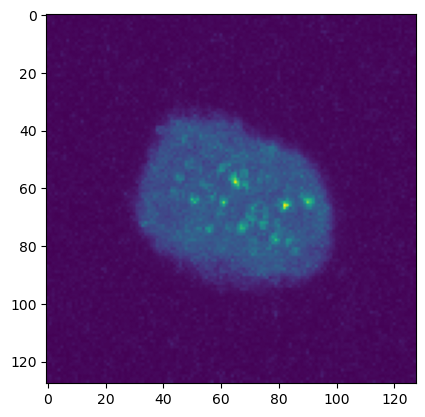

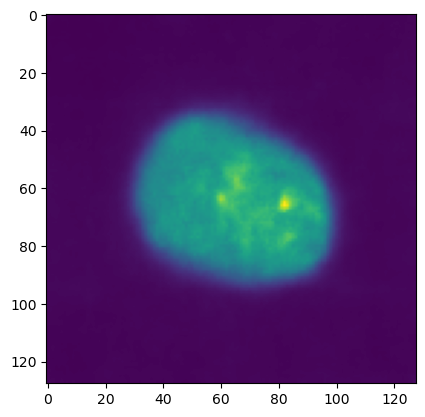

3


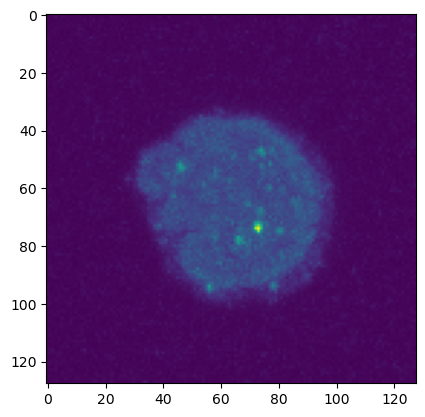

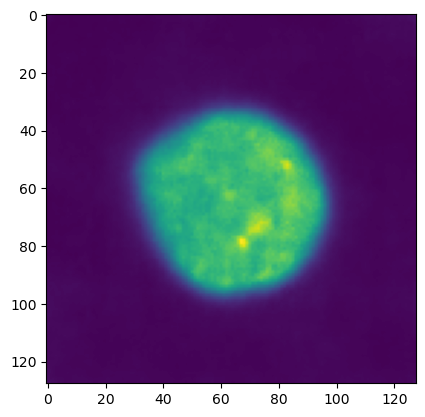

4


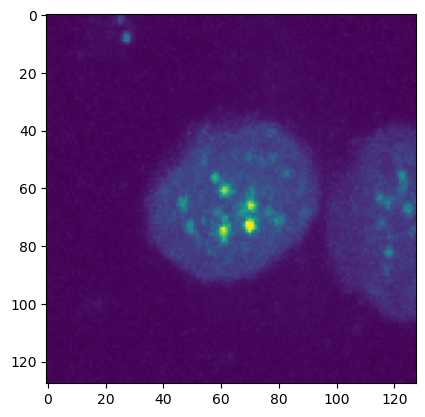

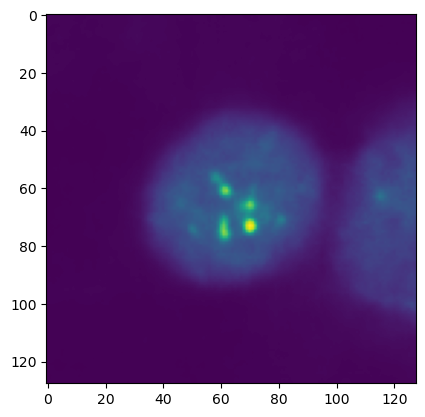

5


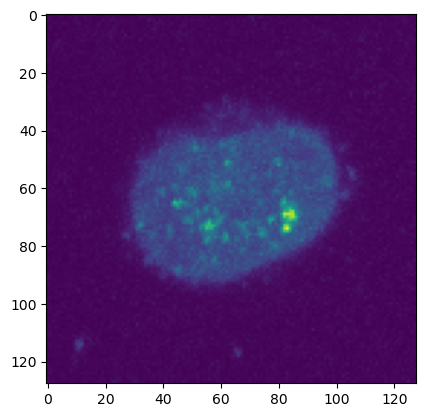

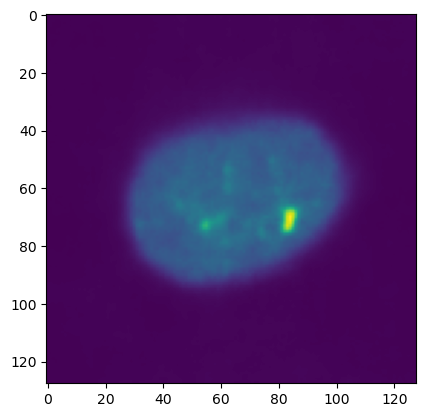

6


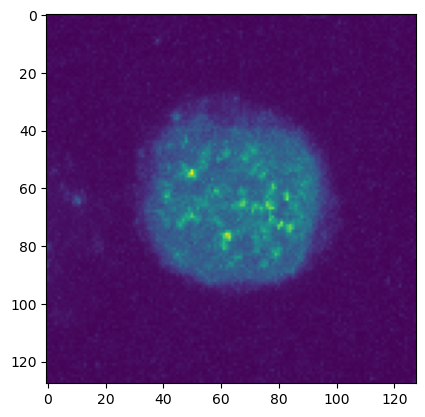

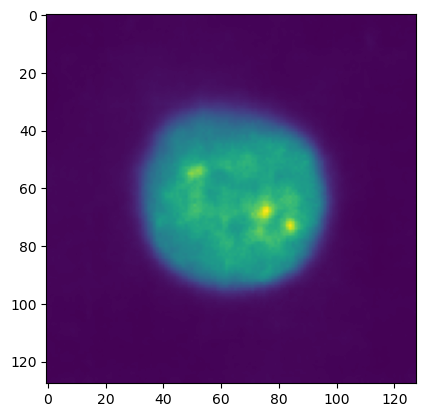

7


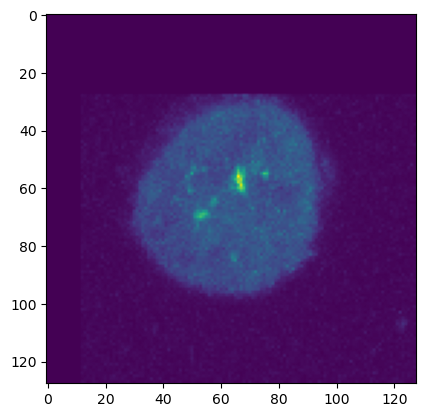

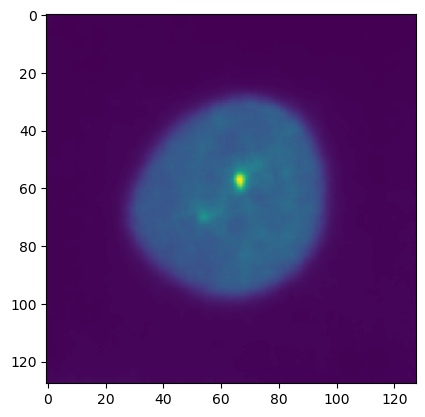

8


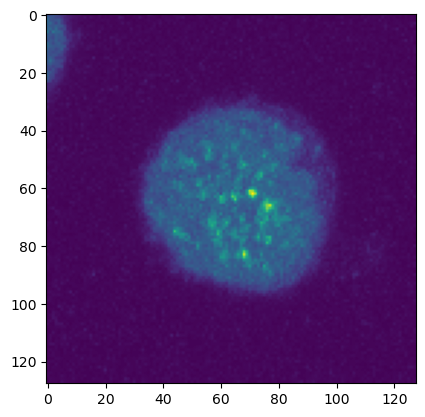

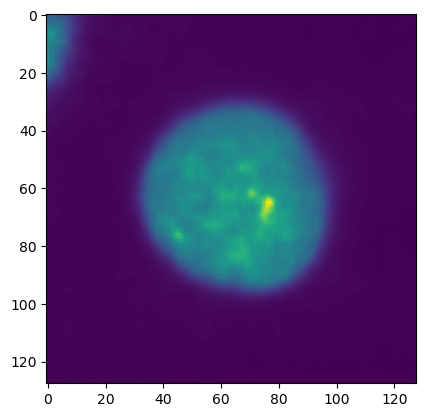

9


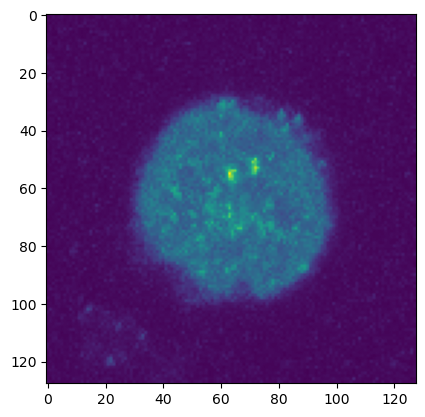

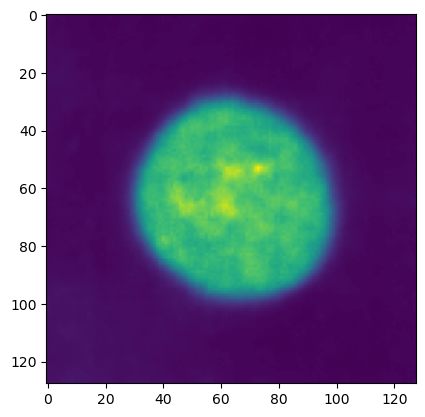

10


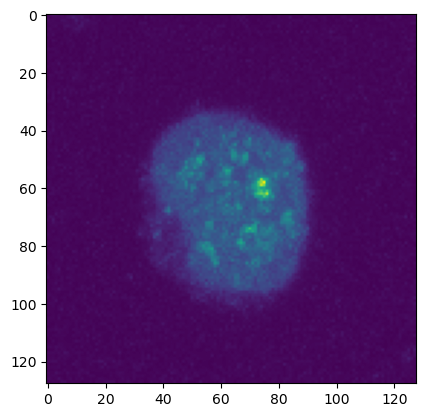

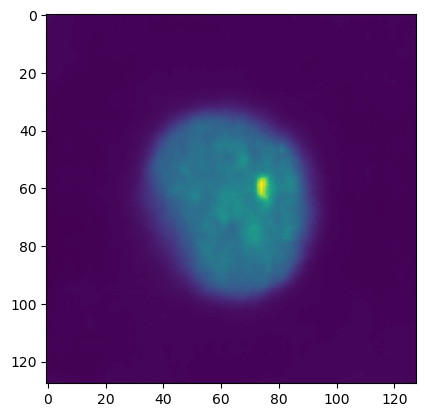

11


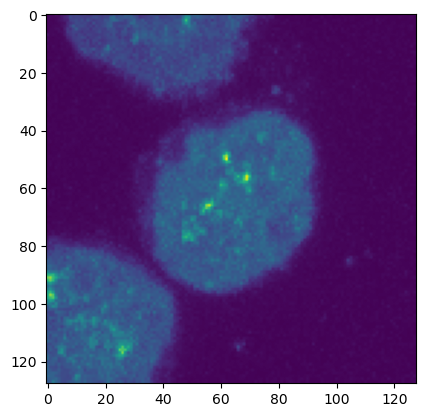

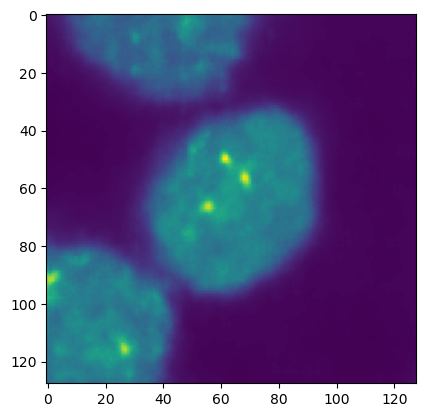

12


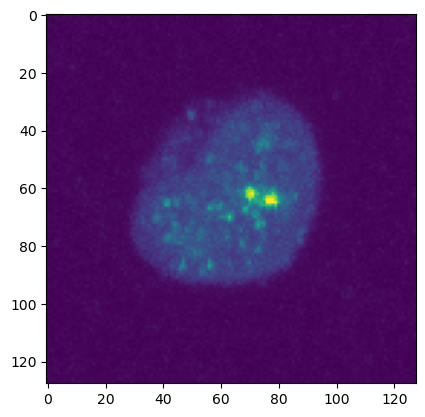

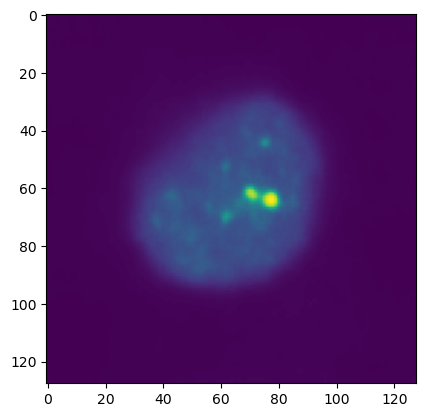

13


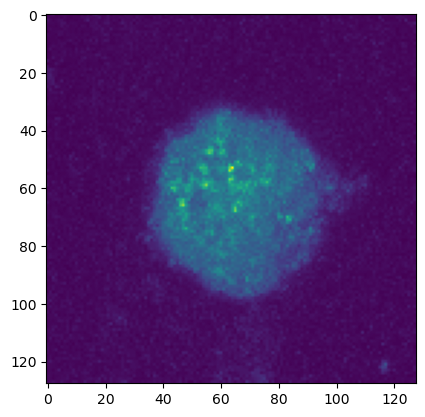

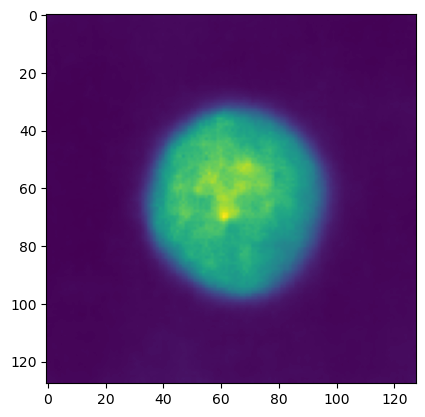

14


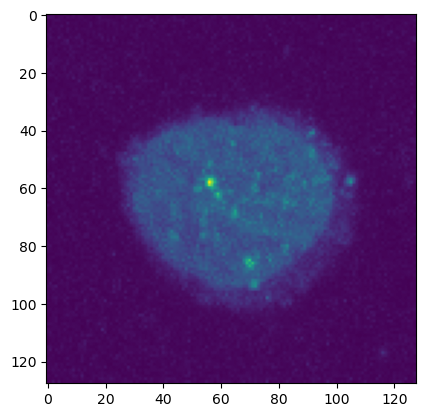

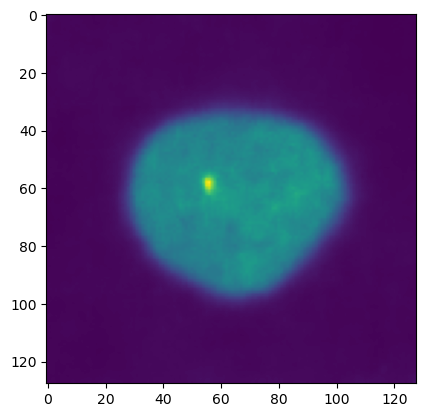

15


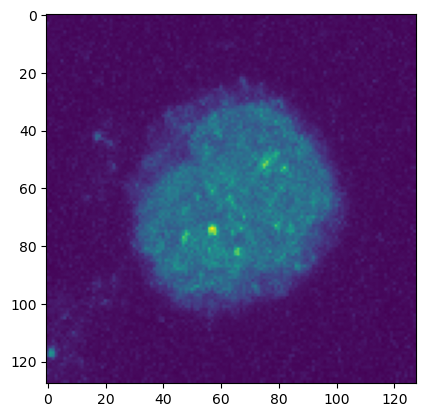

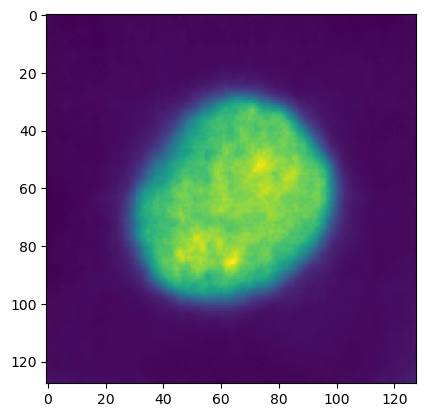

16


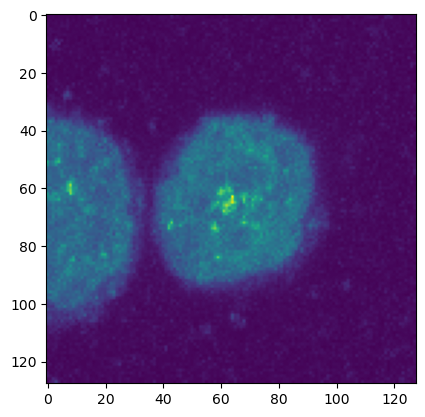

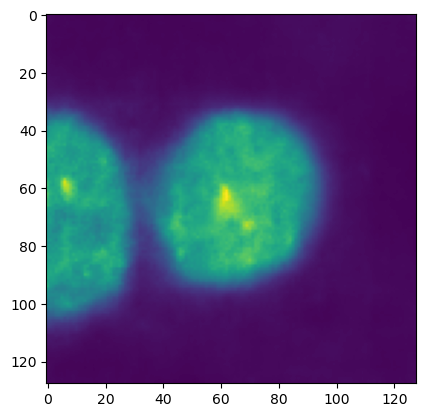

17


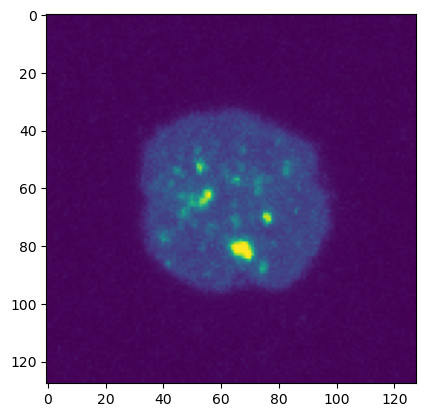

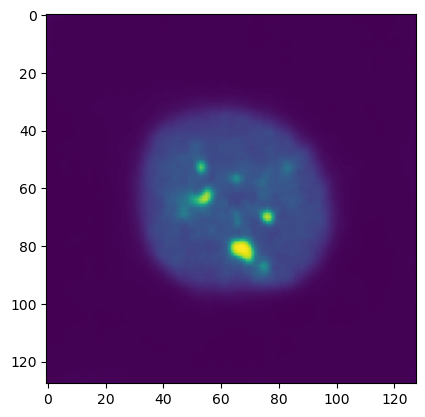

18


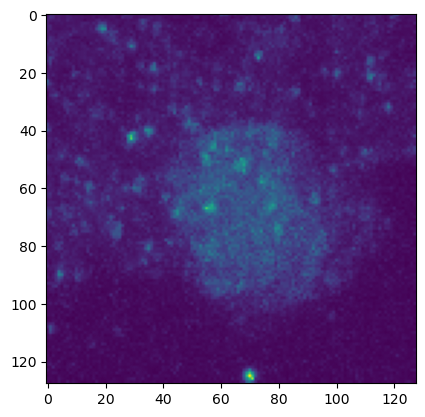

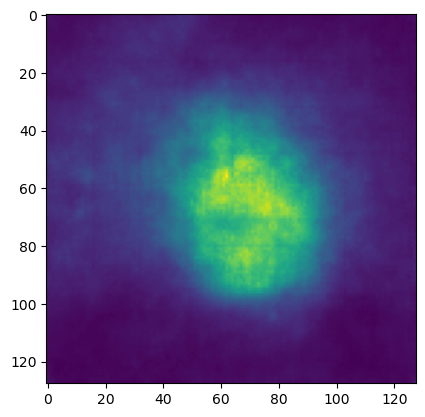

19


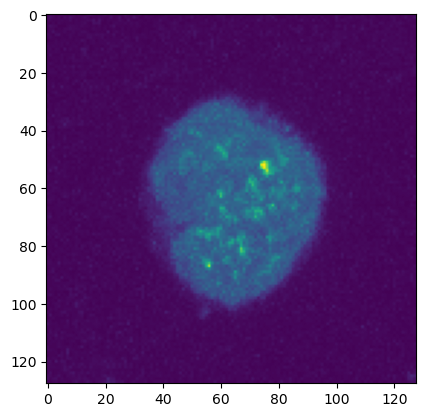

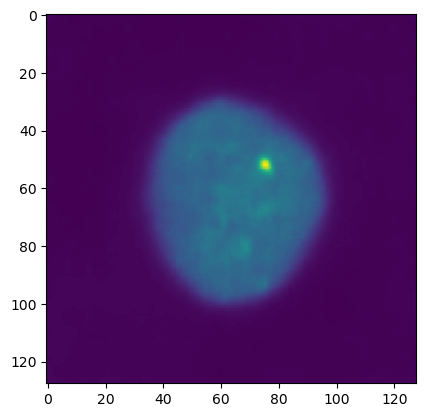

In [15]:
for i in range(20):
    print(i)
    plt.imshow(traintarget_protein[i][0].cpu().detach().numpy())
    plt.show()
    plt.imshow(reconShared_protein[i][0].cpu().detach().numpy())
    plt.show()


0


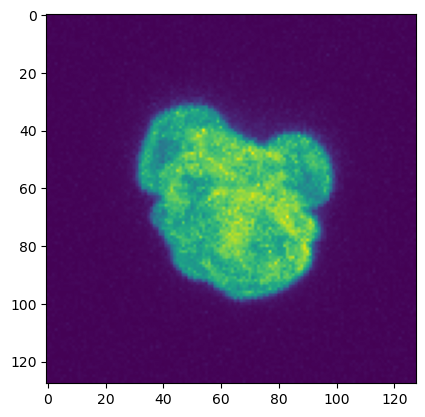

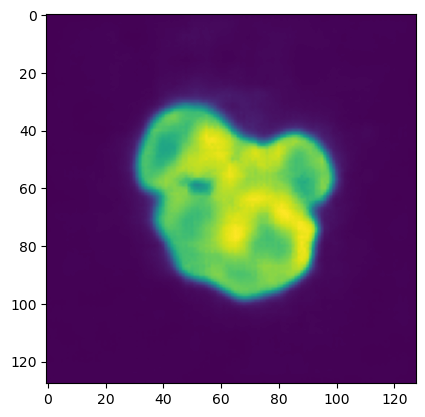

1


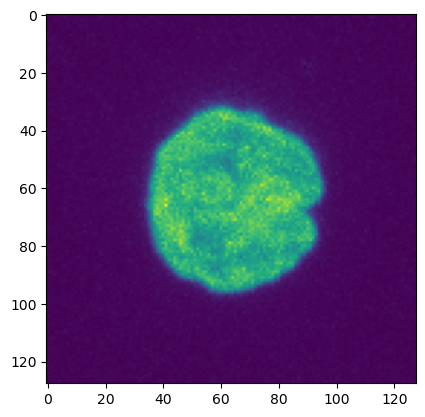

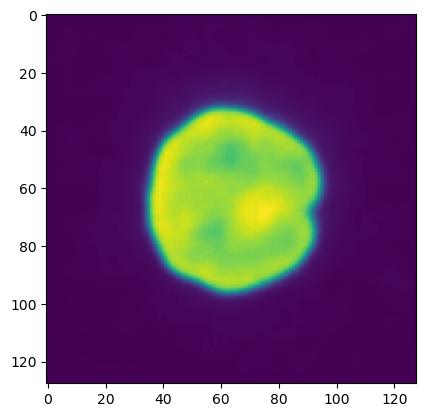

2


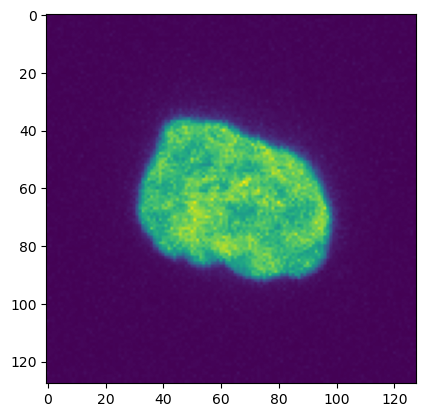

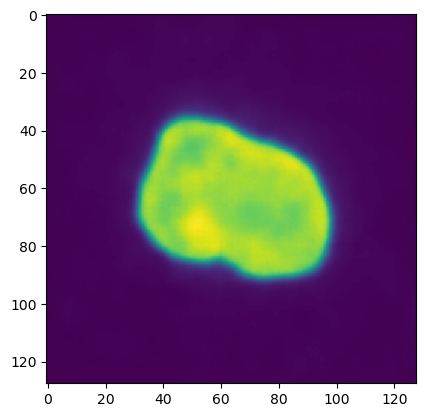

3


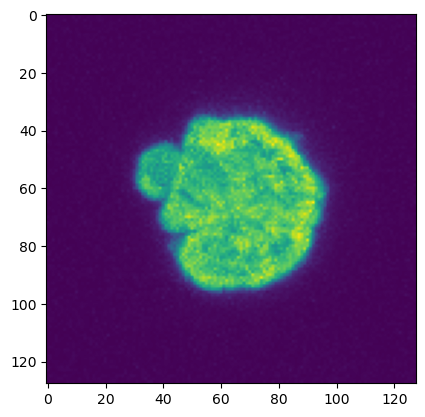

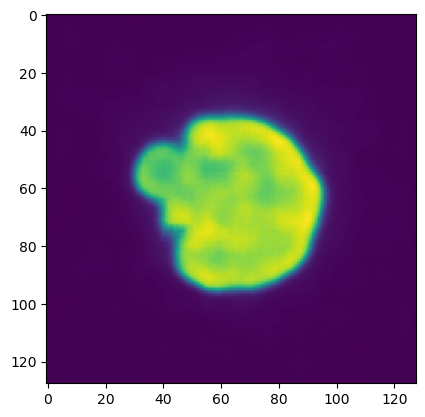

4


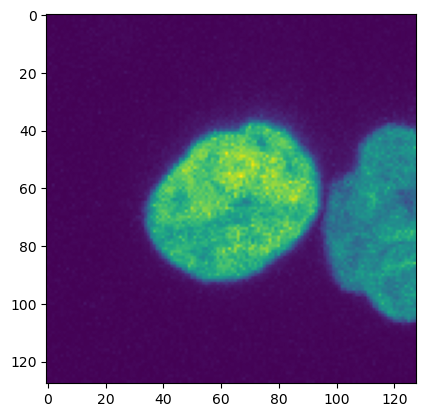

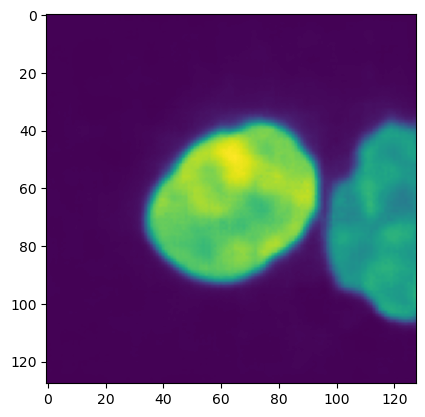

5


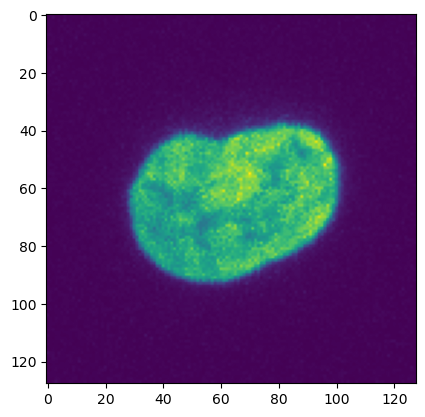

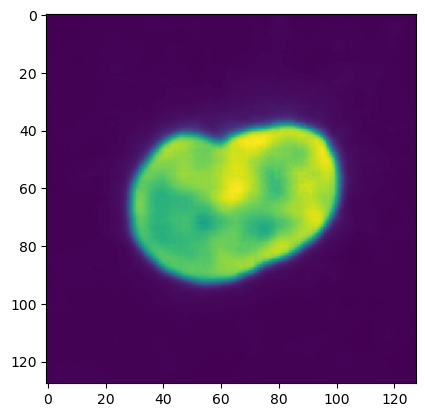

6


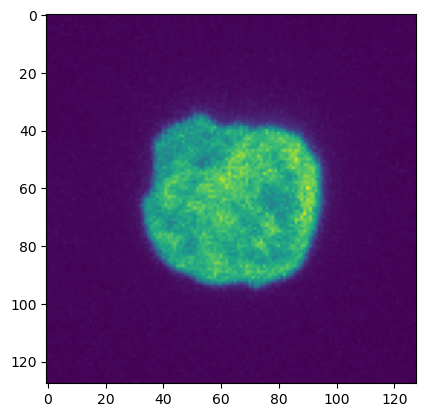

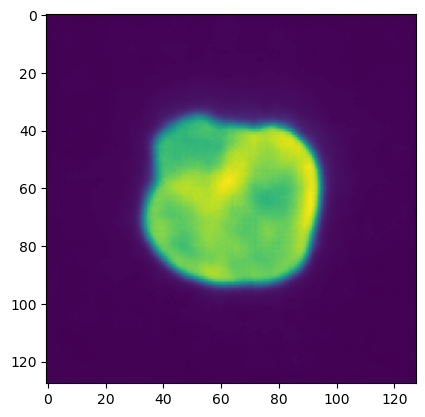

7


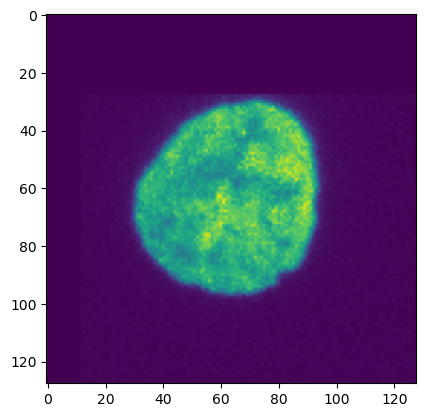

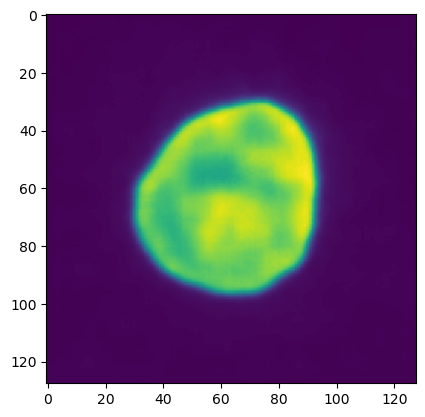

8


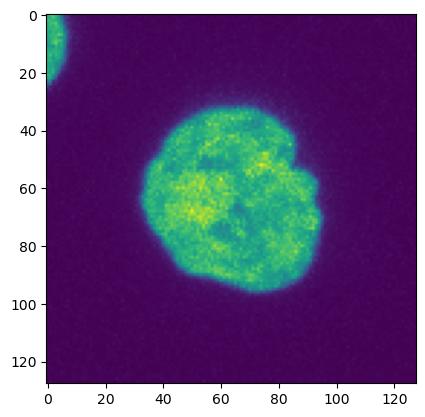

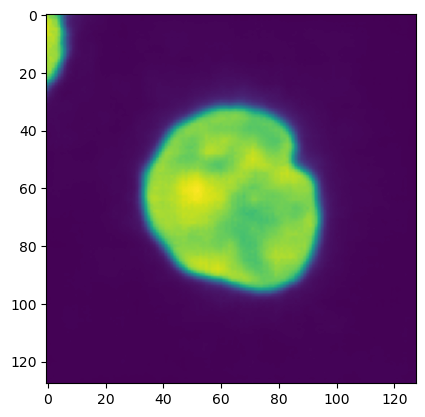

9


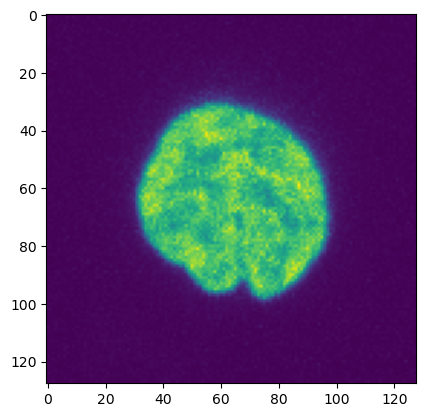

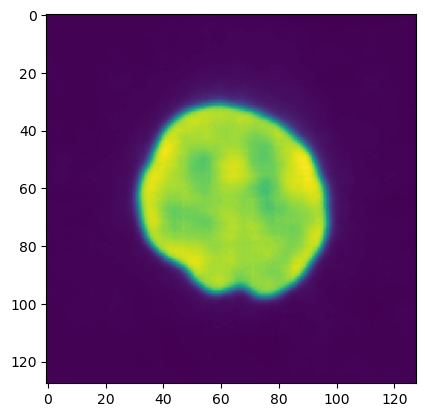

10


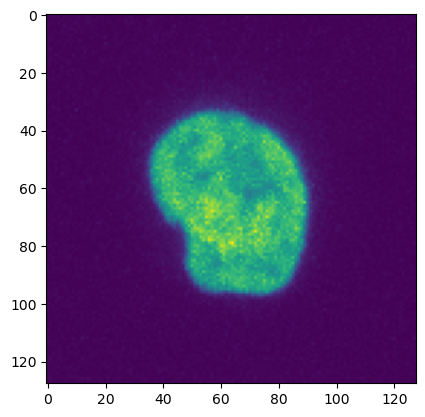

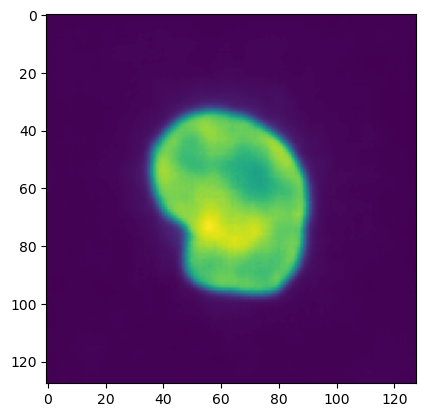

11


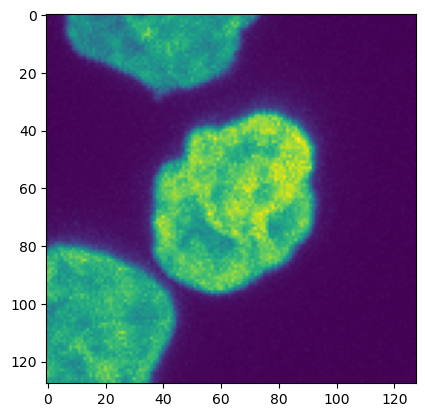

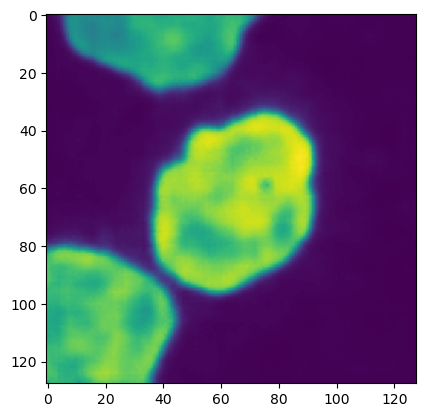

12


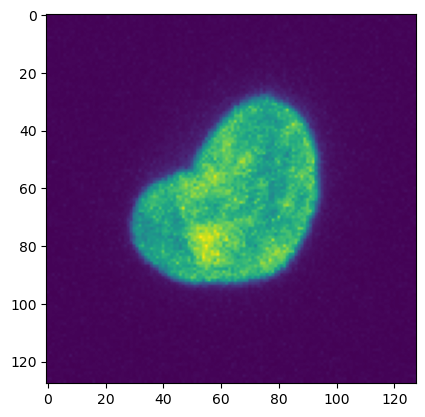

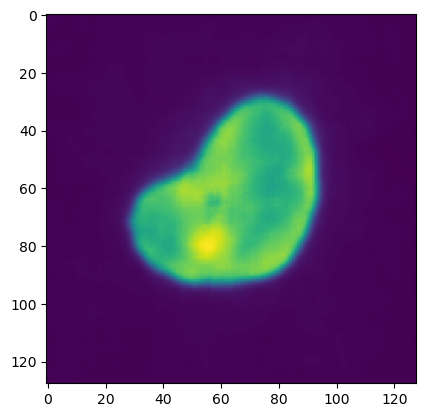

13


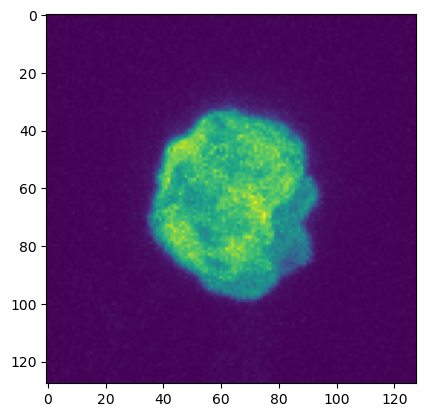

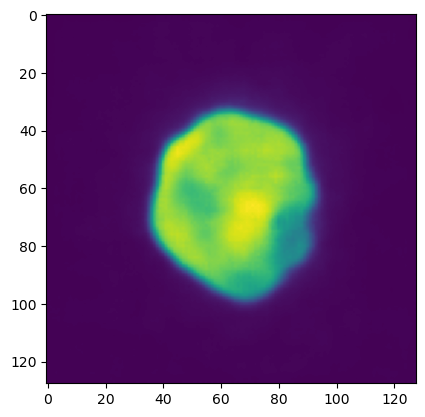

14


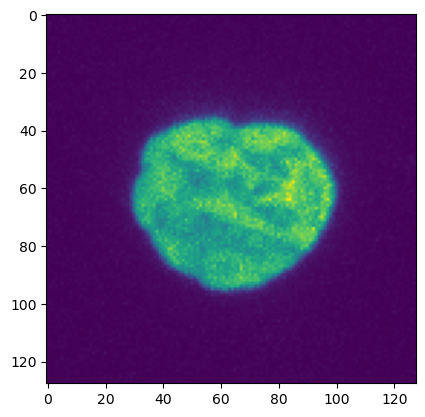

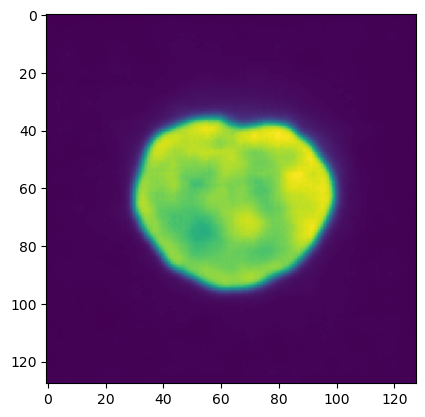

15


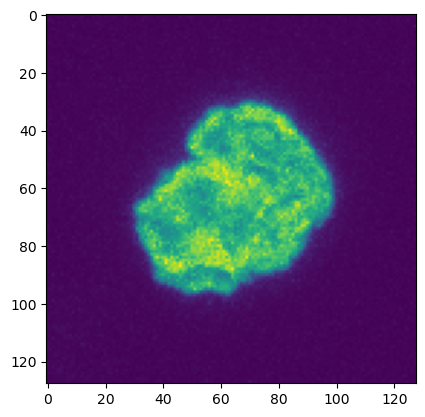

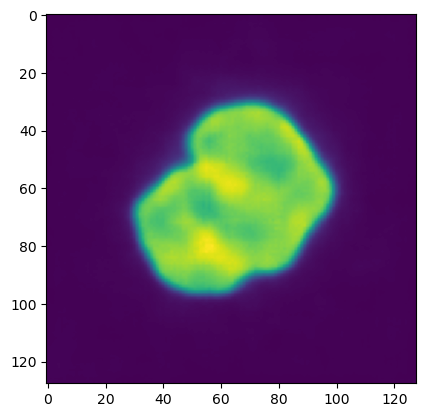

16


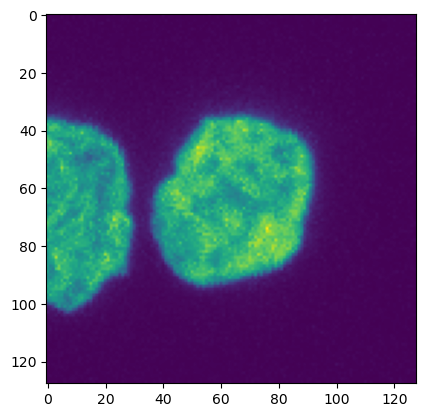

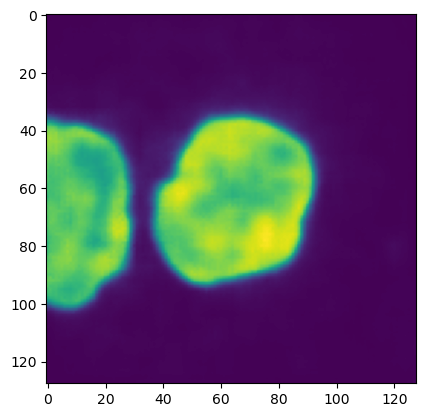

17


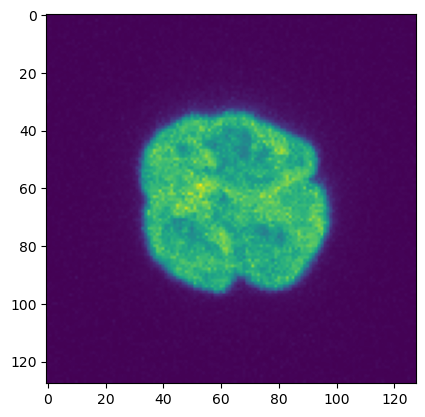

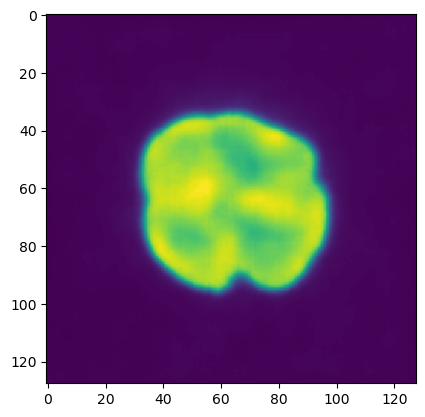

18


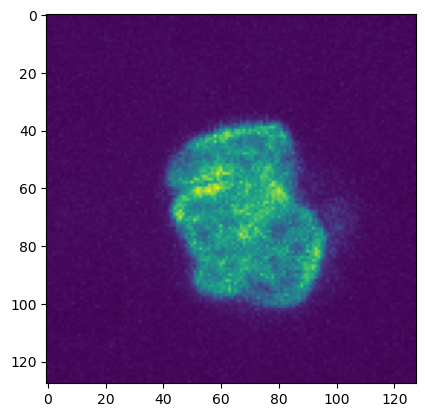

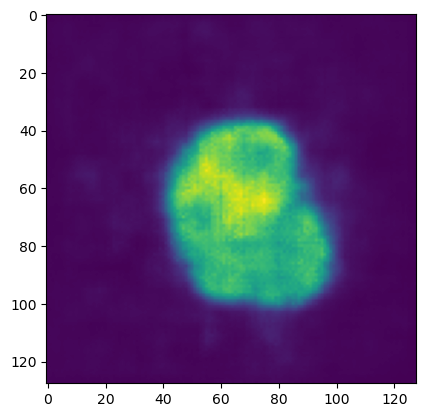

19


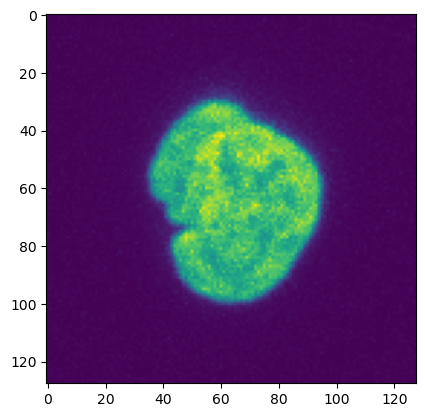

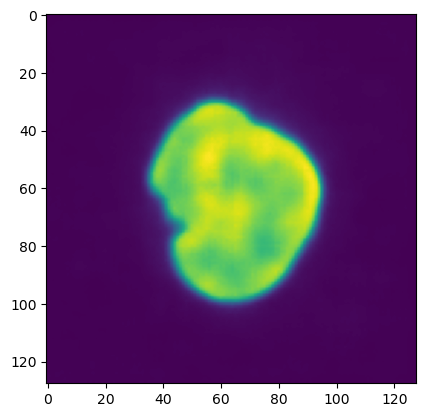

In [16]:
for i in range(20):
    print(i)
    plt.imshow(traintarget_dna[i][0].cpu().detach().numpy())
    plt.show()
    plt.imshow(reconShared_dna[i][0].cpu().detach().numpy())
    plt.show()
